In [114]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
! pip install spacy --upgrade
! python -m spacy download en_core_web_sm
! pip install textacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2023-03-24 20:29:34.355680: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-24 20:29:35.483893: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-24 20:29:35.484026: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could no

In [ ]:
data_aae = pd.read_csv("/content/AAE_Tweets_Sample.csv")
data_aae.head(5)

,tweets
0,Man imissed a called from my bae hella mad -_-...
1,@devontekthomas I did not mean to say dat
2,@devontekthomas awww u do too
3,@devontekthomas wat r u doin boy
4,@ZariaDove I know dats rite


## Exploratory data analysis (EDA): For Top Stopwords, Punctuation and Emoji Analysis

In [ ]:
import spacy
from textacy import preprocessing
nlp = spacy.load('en_core_web_sm')
from spacy.tokenizer import Tokenizer
import re

In [140]:
from collections import defaultdict
import string

regrex_pattern = re.compile(pattern = "["
          u"\U0001F600-\U0001F64F"  # emoticons
          u"\U0001F300-\U0001F5FF"  # symbols & pictographs
          u"\U0001F680-\U0001F6FF"  # transport & map symbols
          u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
          u"\U00002500-\U00002BEF"  # chinese char
          u"\U00002702-\U000027B0"
          u"\U00002702-\U000027B0"
          u"\U000024C2-\U0001F251"
          u"\U0001f926-\U0001f937"
          u"\U00010000-\U0010ffff"
          u"\u2640-\u2642"
          u"\u2600-\u2B55"
          u"\u200d"
          u"\u23cf"
          u"\u23e9"
          u"\u231a"
          u"\ufe0f"  # dingbats
          u"\u3030"
                            "]+", flags = re.UNICODE)

stopwords_dict = defaultdict(int)
punc = defaultdict(int)
emojis = defaultdict(int)

for tweet in data_aae["tweets"]:

  doc = nlp(tweet)

  
  stopwords = spacy.lang.en.stop_words.STOP_WORDS

  for word in tweet:
    # For Stopwords
    if word in stopwords:
      stopwords_dict[word] += 1
    # For Punct
    if word in string.punctuation:
      punc[word] += 1
    # For Emojis and other symbols'
    check_emojis = re.fullmatch(regrex_pattern, word)
    if check_emojis != None:
      emojis[word] += 1


<BarContainer object of 2 artists>

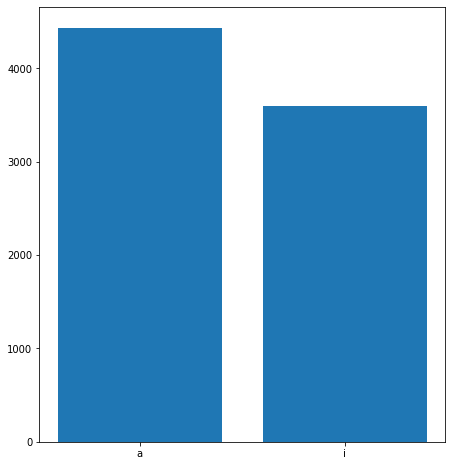

In [141]:
# Graph for Stopwords
top10_stopwords = sorted(stopwords_dict.items(), key=lambda x:x[1], reverse=True)[:10]
x0,y0 = zip(*top10_stopwords)

plt.figure(1, figsize=(16,8))
plt.subplot(1,2,1)
plt.bar(x0,y0)

<BarContainer object of 10 artists>

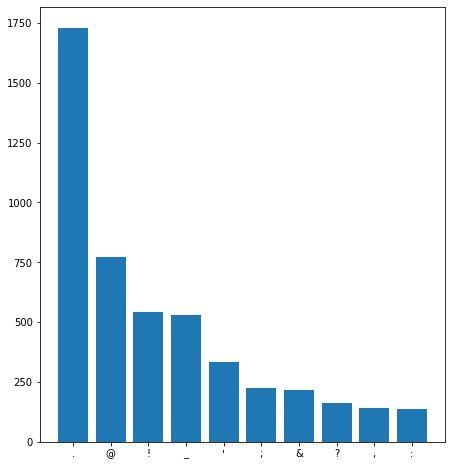

In [142]:
# Graph for punct
top10_punct = sorted(punc.items(), key=lambda x:x[1], reverse=True)[:10]
x0,y0 = zip(*top10_punct)

plt.figure(1, figsize=(16,8))
plt.subplot(1,2,1)
plt.bar(x0,y0)

<BarContainer object of 10 artists>

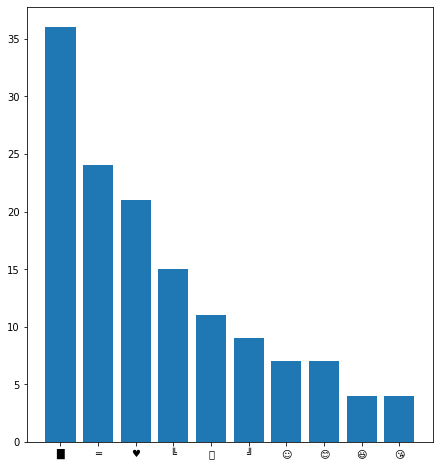

In [143]:
# Graph for Emojis
top10_emojis = sorted(emojis.items(), key=lambda x:x[1], reverse=True)[:10]
x0,y0 = zip(*top10_emojis)

plt.figure(1, figsize=(16,8))
plt.subplot(1,2,1)
plt.bar(x0,y0)

## Tokenization

In [144]:
"""
Reference: Kabilesh, KabileshKabilesh 98466 gold badges2020 silver badges4646 bronze badges, TimTim 2, NickNick 3, sougata sahasougata saha4766 bronze badges, &amp; toshi456toshi45620311 silver badge77 bronze badges.(1965, September 1). Unable to remove some emojis from tweets in Python. Stack Overflow. Retrieved March 24, 2023, from https://stackoverflow.com/questions/53322870/unable-to-remove-some-emojis-from-tweets-in-python 
Function for emoji removal
"""
def remove_emoji(token):
  regrex_pattern = re.compile(pattern = "["
          u"\U0001F600-\U0001F64F"  # emoticons
          u"\U0001F300-\U0001F5FF"  # symbols & pictographs
          u"\U0001F680-\U0001F6FF"  # transport & map symbols
          u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
          u"\U00002500-\U00002BEF"  # chinese char
          u"\U00002702-\U000027B0"
          u"\U00002702-\U000027B0"
          u"\U000024C2-\U0001F251"
          u"\U0001f926-\U0001f937"
          u"\U00010000-\U0010ffff"
          u"\u2640-\u2642"
          u"\u2600-\u2B55"
          u"\u200d"
          u"\u23cf"
          u"\u23e9"
          u"\u231a"
          u"\ufe0f"  # dingbats
          u"\u3030"
                            "]+", flags = re.UNICODE)
  return regrex_pattern.sub(r'', token)

In [145]:
def tokenize(docs, lemmatized=True, remove_stopword=True, remove_punct = True):
    
    tokenized_docs = []

    for doc in docs:
      doc = nlp(doc)
      doc_tokenized = []

      # Lemmatized
      for token in doc:
        if lemmatized:
          doc_tokenized.append(token.lemma_)
        else:
          doc_tokenized.append(token.text)

      # Removing Noises like @, links and emojis from the tweets
      temp_tokens = []
      for token in doc_tokenized:
        if token.startswith('@') and len(token) > 1:
          token = '@user'
        elif token.startswith('http'):
          token = 'http'
        else:
            token = remove_emoji(token)
        temp_tokens.append(token)
      doc_tokenized = temp_tokens
    
      # Remove Stopwords from the tokens
      if remove_stopword:
        stopwords = spacy.lang.en.stop_words.STOP_WORDS
        doc_tokenized = [token for token in doc_tokenized if str(token).lower() not in stopwords]

      # Removed Punc
      if remove_punct:
        doc_tokenized = " ".join([token for token in doc_tokenized])
        doc_tokenized = nlp(doc_tokenized)
        doc_tokenized = [token for token in doc_tokenized if not token.is_punct]

      # Remove empty tokens and lowercase all tokens
      doc_tokenized = [str(token).lower() for token in doc_tokenized if str(token).strip()]
      tokenized_docs.append(doc_tokenized)

    return tokenized_docs

In [146]:
print(data_aae["tweets"].iloc[0] + "\n")
print(f"lemmatized=True, remove_stopword=True, remove_punct = True:\n {tokenize(data_aae['tweets'], lemmatized=True, remove_stopword=True, remove_punct = True)}\n")
tokenized_tweets = tokenize(data_aae['tweets'], lemmatized=True, remove_stopword=True, remove_punct = True)
print(len(tokenized_tweets))

Man imissed a called from my bae hella mad -_- @callme_KRAZII

lemmatized=True, remove_stopword=True, remove_punct = True:
 [['man', 'imisse', 'bae', 'hella', 'mad', '@user'], ['@user', 'mean', 'dat'], ['@user', 'awww', 'u'], ['@user', 'wat', 'r', 'u', 'doin', 'boy'], ['@user', 'know', 'dat', 'rite'], ['try', 'tweeter'], ['wth', 'kenya', 'lmbo', 'time', 'pic', 'different', 'event', 'prove', 'point', 'rhoa'], ['twrkndathunibun'], ['mm', 'dis', 'unusual', 'phone', 'dry', 'af', 'right'], ['@user', 'lol', 'null', 'jus', 'wanna', 'ya', 'hot', 'bother'], ['@user', 'like', 'man'], ['feel', 'good', 'outside', 'tonight'], ['@user', 'lol', 'nall', 'fool', 'ju', 'guess'], ['@user', 'ready', 'tats', 'b4', 'spring', 'break', '.!"1000'], ['u', 'push', 'da', 'right', 'button', 'dance', 'da', 'band', 'lol'], ['datum', 'dryer', 'break', 'dis', 'dry', 'clean'], ['af'], ['cool', 'da', 'hood'], ['@user', 'mm'], ['@user', 'got', 'dread', 'tho'], ['@user', 'wat', 'u', 'sorry', 'fool'], ['@user', 'makee', 'c

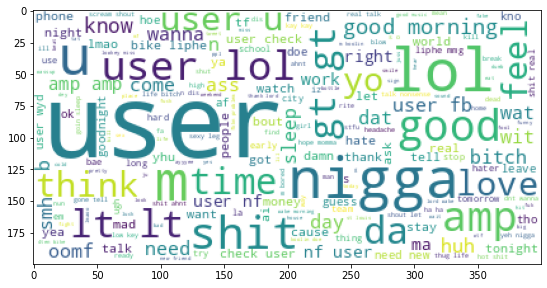

In [147]:
from wordcloud import WordCloud

all_words = []
for tokenized_tweet in tokenized_tweets:
  for word in tokenized_tweet:
    all_words.append(word)
word_cloud = WordCloud(background_color="white", max_font_size=80).generate(" ".join(all_words))
plt.figure(1, figsize=(20, 18))
plt.subplot(1,2,1)
plt.imshow(word_cloud)

## Normalization 

In [148]:
# using dictionary comprehension for iteration
tokenized_tweets_dict = {idx : tokenized_tweets[idx] for idx in range(len(tokenized_tweets))}

# Find the count of each unique token and save the count as a dictionary, named word_dict, i.e., {world: 1, a: 1, ...}
from collections import Counter
for i, para in enumerate(tokenized_tweets_dict.values()):
  word_dict = dict(Counter(para))
  tokenized_tweets_dict[i] = word_dict

print(tokenized_tweets_dict)

{0: {'man': 1, 'imisse': 1, 'bae': 1, 'hella': 1, 'mad': 1, '@user': 1}, 1: {'@user': 1, 'mean': 1, 'dat': 1}, 2: {'@user': 1, 'awww': 1, 'u': 1}, 3: {'@user': 1, 'wat': 1, 'r': 1, 'u': 1, 'doin': 1, 'boy': 1}, 4: {'@user': 1, 'know': 1, 'dat': 1, 'rite': 1}, 5: {'try': 1, 'tweeter': 1}, 6: {'wth': 1, 'kenya': 1, 'lmbo': 1, 'time': 1, 'pic': 1, 'different': 1, 'event': 1, 'prove': 1, 'point': 1, 'rhoa': 1}, 7: {'twrkndathunibun': 1}, 8: {'mm': 1, 'dis': 1, 'unusual': 1, 'phone': 1, 'dry': 1, 'af': 1, 'right': 1}, 9: {'@user': 1, 'lol': 1, 'null': 1, 'jus': 1, 'wanna': 1, 'ya': 1, 'hot': 1, 'bother': 1}, 10: {'@user': 1, 'like': 1, 'man': 1}, 11: {'feel': 1, 'good': 1, 'outside': 1, 'tonight': 1}, 12: {'@user': 1, 'lol': 1, 'nall': 1, 'fool': 1, 'ju': 1, 'guess': 1}, 13: {'@user': 1, 'ready': 1, 'tats': 1, 'b4': 1, 'spring': 1, 'break': 1, '.!"1000': 1}, 14: {'u': 1, 'push': 1, 'da': 2, 'right': 1, 'button': 1, 'dance': 1, 'band': 1, 'lol': 1}, 15: {'datum': 1, 'dryer': 1, 'break': 1, '

In [149]:
# Pools the keys from all the word dictionaries to get a list of unique words, denoted as unique_words
unique_words = set()
for li in tokenized_tweets_dict.values():
  for word in li.keys():
    unique_words.add(word)
unique_words = list(unique_words)
print(unique_words)
print(len(unique_words))

['lhh', 'wonder', 'rock', '9', 'females', 'mind', 'lemonade', 'town', 'jayer', 'der', 'getting', 'day', 'preg', 'turkey', 'city', 'blackplanet', 'h', 'idk', 'bind', 'flat', 'happen', 'stupid', 'traffic', 'iz', 'scouts', 'pocket', 'hair', 'smoke', 'phaggetz', 'answer', 'tonite', 'flu', 'dread', 'role', 'straight', 'sexy', 'loop', '2bad', 'low', 'boomin', 'whew', 'hav', 'player', 'friend', 'heat', 'ah', 'point', 'bitches', 'bbq', 'playiin', 'smile', 'evil', 'nan', 'datum', 'litter', 'struggle', 'finish', 'plz', 'comfy', 'damn', 'mmgz', '30', 'tl', 'dream', 'nah', 'text', 'outsidee', 'business', 'trust', 'break', 'frio', 'guddmorne', 'headphone', 'outtt', 'ai', 'color', 'nope', 'catchh', 'day&gt;&gt;&gt;&gt', 'yeah', 'reason', 'remixxxxxxxxxxxx', 'limit', 'want', 'washington', '2:51', 'wth', 'need', 'terrenche', 'bein', 'winnin', 'phree', 'noon', 'throat', 'beg', 'tattoo', ':|', 'network', 'voize', 'model', 'soo', 'moanin', 'lunky', 'obama', 'male', 'favorite', 'bae', 'fa', 'btw', 'loyal'

In [150]:
# Creates a numpy array, say dtm with a shape (# of tokenized_tweets_dict x # of unique words), and set the initial values to 0.
dtm = np.zeros((len(tokenized_tweets_dict.keys()), len(unique_words)))
dtm.shape

(1974, 1649)

In [155]:
# Fills cell dtm[i,j] with the count of the jth word in the ith row in tokenized_tweets_dict
for i, j in enumerate(dtm):
  for k in range(len(j)):
    if unique_words[k] in tokenized_tweets_dict[i]:
      j[k] = tokenized_tweets_dict[i][unique_words[k]]

dtm

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 

In [ ]:
# Calculates the paragraph frequency for each word
k = np.where(dtm>0, 1, 0)
df = np.sum(k,axis=0)

# Normalizes the word count per paragraph
normalized_dtm = dtm / dtm.sum(axis=1).reshape((-1,1))

normalized_dtm

<ipython-input-156-57a4cbe42e9f>:6: RuntimeWarning: invalid value encountered in true_divide
  normalized_dtm = dtm / dtm.sum(axis=1).reshape((-1,1))


## Sentiment Analysis

In [ ]:
def compute_sentiment(tweets_tokens, pos, neg ):
    
    result = None
    
    set_pos = set(pos)
    set_neg = set(neg)

    def func(text):
      posi = 0
      nega = 0
      for i in text:
        if i in set_pos:
          posi += 1
        elif i in set_neg:
          nega += 1
      return (posi-nega)/(posi+nega) if (posi+nega) > 0 else 0 

    new = pd.DataFrame({"aae_tweets_tokens": tweets_tokens})
    new["aae_sentiment"] = new["aae_tweets_tokens"].apply(func)
    result = new[["aae_sentiment"]]

    return result

In [ ]:
pos = pd.read_csv("/content/positive-words.txt", header = None)
pos.head()

,0
0,a+
1,abound
2,abounds
3,abundance
4,abundant


In [ ]:
neg = pd.read_csv("/content/negative-words.txt", header = None)
neg.head()

,0
0,2-faced
1,2-faces
2,abnormal
3,abolish
4,abominable


In [ ]:
tweets_tokens = tokenize(data_aae['tweets'], lemmatized=True, remove_stopword=True, remove_punct = True)

In [ ]:
result = compute_sentiment(tweets_tokens, 
                           pos[0].values,
                           neg[0].values)
result.head(500)

,aae_sentiment
0,-1.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
495,-1.0
496,-1.0
497,0.0
498,0.0
